In [1]:
import cv2
import numpy as np
from PIL import Image
from matplotlib import pyplot as plt
from scipy.ndimage import laplace
import os

from fitting_helper import fit_glasses_to_face

from evaluate_qualitative import calculate_lpips, calculate_sam_clip_metrics

I0000 00:00:1776600044.275560   58220 gl_context_egl.cc:85] Successfully initialized EGL. Major : 1 Minor: 5
I0000 00:00:1776600044.354206   59000 gl_context.cc:357] GL version: 3.2 (OpenGL ES 3.2 NVIDIA 535.288.01), renderer: NVIDIA L4/PCIe/SSE2
INFO: Created TensorFlow Lite XNNPACK delegate for CPU.
W0000 00:00:1776600044.359458   58999 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1776600044.369372   58998 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
Disabling PyTorch because PyTorch >= 2.1 is required but foun

In [2]:
glasses_articles = [
    "110020220079_01.png", 
    #"110020220086_01.png", 
    "110020234383_01.png", 
    #"190605021125_01.png",
    "190605067703_01.png"
    ]

glasses_with_masks = []

for article in glasses_articles:
    
    new_glasses = Image.open(f"../../frames_new/imgs/{article}").convert("RGB").resize((512, 512))
    new_masks = Image.open(f"../../frames_new/masks/{article}").convert("L").resize((512, 512))
    
    glasses_with_masks.append((new_glasses, new_masks))

bg_articles = [
    "../../results/real_faces/FFHQ_3.jpg",
    "../../results/real_faces/FFHQ_4.jpg",
    "../../results/real_faces/FFHQ_5.jpg"
]

bg_imgs = []

for a in bg_articles:
    new_bg = Image.open(a).convert("RGB").resize((512, 512))
    bg_imgs.append(new_bg)

/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/google/protobuf/symbol_database.py:55: UserWarning: SymbolDatabase.GetPrototype() is deprecated. Please use message_factory.GetMessageClass() instead. SymbolDatabase.GetPrototype() will be removed soon.
  warnings.warn('SymbolDatabase.GetPrototype() is deprecated. Please '


Face 0 x Glasses 0 | LPIPS (V): 0.0299 | SAM IoU (^): 0.1047 | SAM Dice (V): 0.8104
Face 0 x Glasses 1 | LPIPS (V): 0.0228 | SAM IoU (^): 0.1116 | SAM Dice (V): 0.7991
Face 0 x Glasses 2 | LPIPS (V): 0.0313 | SAM IoU (^): 0.0506 | SAM Dice (V): 0.9037
Face 1 x Glasses 0 | LPIPS (V): 0.0329 | SAM IoU (^): 0.0573 | SAM Dice (V): 0.8917
Face 1 x Glasses 1 | LPIPS (V): 0.0264 | SAM IoU (^): 0.0511 | SAM Dice (V): 0.9027
Face 1 x Glasses 2 | LPIPS (V): 0.0326 | SAM IoU (^): 0.0126 | SAM Dice (V): 0.9750
Face 2 x Glasses 0 | LPIPS (V): 0.0341 | SAM IoU (^): 0.0726 | SAM Dice (V): 0.8646
Face 2 x Glasses 1 | LPIPS (V): 0.0241 | SAM IoU (^): 0.0585 | SAM Dice (V): 0.8895
Face 2 x Glasses 2 | LPIPS (V): 0.0407 | SAM IoU (^): 0.0462 | SAM Dice (V): 0.9117
Saved individual results and grid to results/traditional_blend/poisson


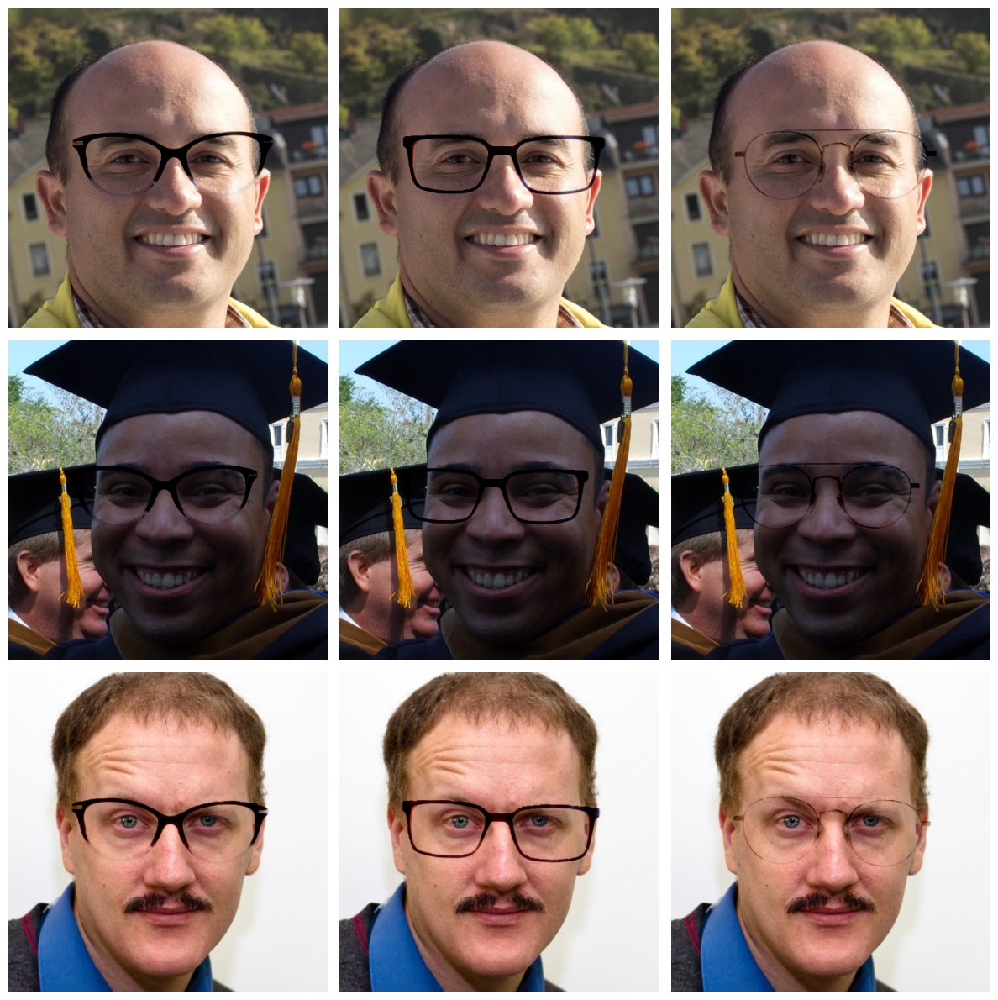

In [4]:
# POISSON BLEND

method_name = "poisson"

def poisson_blend(src_img, bg_img, mask_img, verbose=False):
    src_img = src_img / 255.0
    bg_img = bg_img / 255.0

    src_coords = np.argwhere(mask_img)

    src_top, src_left = np.min(src_coords, axis=0) - 1
    src_bottom, src_right = np.max(src_coords, axis=0) + 1

    mask_patch = mask_img[src_top : src_bottom + 1, src_left : src_right + 1]
    src_patch = src_img[src_top : src_bottom + 1, src_left : src_right + 1]

    target_top, target_left = (src_top + bg_img.shape[0] - src_img.shape[0], src_left + bg_img.shape[1] - src_img.shape[1])

    target_bottom, target_right = (
        target_top + mask_patch.shape[0],
        target_left + mask_patch.shape[1],
    )

    target_patch = bg_img[target_top:target_bottom, target_left:target_right]

    blend_patch = np.stack(
        [
            poisson_blend_helper(target_patch[:, :, i], src_patch[:, :, i], mask_patch, verbose=verbose)
            for i in range(3) # i = 0 for red, i = 1 for green, i = 2 for blue
        ],
        axis=2,
    )
    
    blended_full = bg_img.copy()
    blended_full[target_top:target_bottom, target_left:target_right] = blend_patch
    
    return blended_full

def poisson_blend_helper(target_img, src_img, mask_img, iter: int = 2048, verbose=False):
    assert target_img.shape == src_img.shape, "Images must match"
    for i in range(iter):
        if verbose and i % 500 == 0:
          print(f"conducted {i} iterations")
        target_img = target_img + 0.25 * mask_img * laplace(target_img - src_img)
    return target_img.clip(0, 1)


output_dir = f"results/traditional_blend/{method_name}"
os.makedirs(output_dir, exist_ok=True)
os.makedirs("temp_eval", exist_ok=True)

num_faces = len(bg_imgs)
num_glasses = len(glasses_with_masks)

fig, axes = plt.subplots(nrows=num_faces, ncols=num_glasses, figsize=(4 * num_glasses, 4 * num_faces))

# If it's a 1D array (e.g. 1 face, 3 glasses), wrap it to avoid indexing errors
if num_faces == 1 or num_glasses == 1:
    axes = np.array(axes).reshape(num_faces, num_glasses)

for f_idx, bg_img in enumerate(bg_imgs):
    for g_idx, (glasses, mask) in enumerate(glasses_with_masks):
        
        # 0. Fit glasses to face
        aligned_glasses, aligned_mask = fit_glasses_to_face(bg_img, glasses, mask)
        
        # A. Run Diffusion Harmonization
        result = poisson_blend(np.array(aligned_glasses), np.array(bg_img), np.array(aligned_mask) / 255.0)
        
        # B. Save the result
        res_path = os.path.join(output_dir, f"FFHQ_{f_idx}x{g_idx}.png")
        result = Image.fromarray((result * 255).astype(np.uint8))
        result.save(res_path)
        
        # C. Create & Save Naive Copy-Paste (needed for LPIPS baseline)
        naive_result = Image.composite(aligned_glasses, bg_img, aligned_mask)
        naive_path = f"temp_eval/naive_{f_idx}x{g_idx}.png"
        naive_result.save(naive_path)
        
        # D. Save mask temporarily (needed for SAM 2 eval)
        mask_path = f"temp_eval/mask_{g_idx}.png"
        mask.save(mask_path)
        
        # E. Calculate Qualitative Scores
        lpips_score = calculate_lpips(naive_path, res_path)
        iou, mse, dice, sam_mask = calculate_sam_clip_metrics(res_path, mask_path)
        
        cv2.imwrite(os.path.join(output_dir, f"FFHQ_{f_idx}x{g_idx})sam_mask.png"), sam_mask)
        
        print(f"Face {f_idx} x Glasses {g_idx} | LPIPS (V): {lpips_score:.4f} | SAM IoU (^): {iou:.4f} | SAM Dice (V): {dice:.4f}")
        
        # F. Plot on the Grid
        ax = axes[f_idx, g_idx]
        ax.imshow(result)
        ax.axis("off")
        


plt.tight_layout()
grid_path = os.path.join(output_dir, "grid_summary.png")
plt.savefig(grid_path, dpi=600, bbox_inches='tight')
print(f"Saved individual results and grid to {output_dir}")
plt.show()

Face 0 x Glasses 0 | LPIPS (V): 0.0243 | SAM IoU (^): 0.1021 | SAM Dice (V): 0.8147
Face 0 x Glasses 1 | LPIPS (V): 0.0270 | SAM IoU (^): 0.1017 | SAM Dice (V): 0.8154
Face 0 x Glasses 2 | LPIPS (V): 0.0174 | SAM IoU (^): 0.0453 | SAM Dice (V): 0.9133
Face 1 x Glasses 0 | LPIPS (V): 0.0136 | SAM IoU (^): 0.0854 | SAM Dice (V): 0.8427
Face 1 x Glasses 1 | LPIPS (V): 0.0192 | SAM IoU (^): 0.0718 | SAM Dice (V): 0.8660
Face 1 x Glasses 2 | LPIPS (V): 0.0075 | SAM IoU (^): 0.0233 | SAM Dice (V): 0.9545
Face 2 x Glasses 0 | LPIPS (V): 0.0317 | SAM IoU (^): 0.0743 | SAM Dice (V): 0.8616
Face 2 x Glasses 1 | LPIPS (V): 0.0315 | SAM IoU (^): 0.0587 | SAM Dice (V): 0.8892
Face 2 x Glasses 2 | LPIPS (V): 0.0144 | SAM IoU (^): 0.0469 | SAM Dice (V): 0.9104
Saved individual results and grid to results/traditional_blend/frequency_domain_harmonization


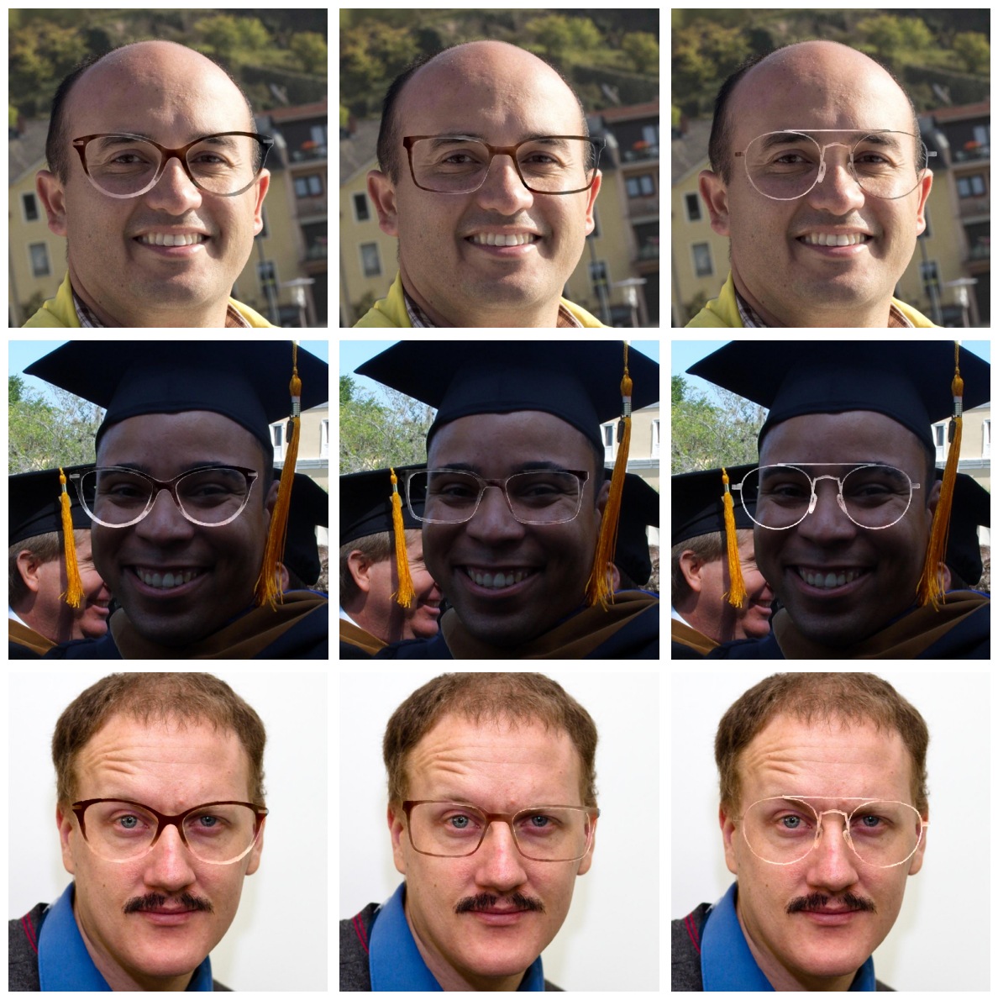

In [5]:
# FREQUENCY DOMAIN

method_name = "frequency_domain_harmonization"

def frequency_domain_harmonization(src, dst, mask):
    """Frequency domain harmonization using FFT on luminance only"""
    
    # Convert to YUV color space
    src_yuv = cv2.cvtColor(src, cv2.COLOR_RGB2YUV).astype(np.float32)
    dst_yuv = cv2.cvtColor(dst, cv2.COLOR_RGB2YUV).astype(np.float32)
    
    result_yuv = dst_yuv.copy()
    
    # Harmonize only the Y (luminance) channel
    channel = 0  # Y
    src_channel = src_yuv[:, :, channel]
    dst_channel = dst_yuv[:, :, channel]
    
    # Apply FFT
    src_fft = np.fft.fft2(src_channel)
    dst_fft = np.fft.fft2(dst_channel)
    
    # Shift zero freq to center
    src_fft_shifted = np.fft.fftshift(src_fft)
    dst_fft_shifted = np.fft.fftshift(dst_fft)
    
    # Magnitude and phase
    src_magnitude = np.abs(src_fft_shifted)
    src_phase = np.angle(src_fft_shifted)
    
    dst_magnitude = np.abs(dst_fft_shifted)
    dst_phase = np.angle(dst_fft_shifted)
    
    # Create low-pass filter mask
    h, w = src_channel.shape
    center_h, center_w = h // 2, w // 2
    y, x = np.ogrid[:h, :w]
    freq_mask = ((x - center_w) ** 2 + (y - center_h) ** 2) <= (min(h, w) * 0.1) ** 2
    
    if np.any(mask > 0.5):
        # Match magnitude
        fg_mag_mean = np.mean(src_magnitude[freq_mask])
        bg_mag_mean = np.mean(dst_magnitude[freq_mask])
        
        mag_scale = bg_mag_mean / fg_mag_mean if fg_mag_mean > 0 else 1.0
        
        harmonized_magnitude = src_magnitude * mag_scale
        harmonized_phase = src_phase
        
        # Blend with destination
        blended_magnitude = harmonized_magnitude * 0.7 + dst_magnitude * 0.3
        blended_phase = harmonized_phase * 0.8 + dst_phase * 0.2
        
        harmonized_fft = blended_magnitude * np.exp(1j * blended_phase)
        harmonized_fft = np.fft.ifftshift(harmonized_fft)
        harmonized_channel = np.real(np.fft.ifft2(harmonized_fft))
        
        # Clip and blend
        harmonized_channel = np.clip(harmonized_channel, 0, 255)
        result_yuv[:, :, channel] = dst_channel * (1 - mask) + harmonized_channel * mask
    
    # Clip and convert back
    result_yuv = np.clip(result_yuv, 0, 255).astype(np.uint8)
    result = cv2.cvtColor(result_yuv, cv2.COLOR_YUV2RGB)
    
    return result

method_name = "frequency_domain_harmonization"
output_dir = f"results/traditional_blend/{method_name}"
os.makedirs(output_dir, exist_ok=True)
os.makedirs("temp_eval", exist_ok=True)

num_faces = len(bg_imgs)
num_glasses = len(glasses_with_masks)

fig, axes = plt.subplots(nrows=num_faces, ncols=num_glasses, figsize=(4 * num_glasses, 4 * num_faces))

# If it's a 1D array (e.g. 1 face, 3 glasses), wrap it to avoid indexing errors
if num_faces == 1 or num_glasses == 1:
    axes = np.array(axes).reshape(num_faces, num_glasses)

for f_idx, bg_img in enumerate(bg_imgs):
    for g_idx, (glasses, mask) in enumerate(glasses_with_masks):
        
        # 0. Fit glasses to face
        aligned_glasses, aligned_mask = fit_glasses_to_face(bg_img, glasses, mask)
        
        # A. Run Diffusion Harmonization
        result = frequency_domain_harmonization(np.array(aligned_glasses), np.array(bg_img), np.array(aligned_mask) / 255.0)
        
        # B. Save the result
        res_path = os.path.join(output_dir, f"FFHQ_{f_idx}x{g_idx}.png")
        result = Image.fromarray((result).astype(np.uint8))
        result.save(res_path)
        
        # C. Create & Save Naive Copy-Paste (needed for LPIPS baseline)
        naive_result = Image.composite(aligned_glasses, bg_img, aligned_mask)
        naive_path = f"temp_eval/naive_{f_idx}x{g_idx}.png"
        naive_result.save(naive_path)
        
        # D. Save mask temporarily (needed for SAM 2 eval)
        mask_path = f"temp_eval/mask_{g_idx}.png"
        mask.save(mask_path)
        
        # E. Calculate Qualitative Scores
        lpips_score = calculate_lpips(naive_path, res_path)
        iou, mse, dice, sam_mask = calculate_sam_clip_metrics(res_path, mask_path)
        
        cv2.imwrite(os.path.join(output_dir, f"FFHQ_{f_idx}x{g_idx})sam_mask.png"), sam_mask)
        
        print(f"Face {f_idx} x Glasses {g_idx} | LPIPS (V): {lpips_score:.4f} | SAM IoU (^): {iou:.4f} | SAM Dice (V): {dice:.4f}")
        
        # F. Plot on the Grid
        ax = axes[f_idx, g_idx]
        ax.imshow(result)
        ax.axis("off")
        


plt.tight_layout()
grid_path = os.path.join(output_dir, "grid_summary.png")
plt.savefig(grid_path, dpi=600, bbox_inches='tight')
print(f"Saved individual results and grid to {output_dir}")
plt.show()

Face 0 x Glasses 0 | LPIPS (V): 0.0949 | SAM IoU (^): 0.1008 | SAM Dice (V): 0.8169
Face 0 x Glasses 1 | LPIPS (V): 0.0945 | SAM IoU (^): 0.1045 | SAM Dice (V): 0.8107
Face 0 x Glasses 2 | LPIPS (V): 0.0996 | SAM IoU (^): 0.0485 | SAM Dice (V): 0.9075
Face 1 x Glasses 0 | LPIPS (V): 0.0647 | SAM IoU (^): 0.1235 | SAM Dice (V): 0.7802
Face 1 x Glasses 1 | LPIPS (V): 0.0654 | SAM IoU (^): 0.1017 | SAM Dice (V): 0.8153
Face 1 x Glasses 2 | LPIPS (V): 0.0679 | SAM IoU (^): 0.0420 | SAM Dice (V): 0.9193
Face 2 x Glasses 0 | LPIPS (V): 0.0838 | SAM IoU (^): 0.0752 | SAM Dice (V): 0.8600
Face 2 x Glasses 1 | LPIPS (V): 0.0845 | SAM IoU (^): 0.0585 | SAM Dice (V): 0.8894
Face 2 x Glasses 2 | LPIPS (V): 0.0895 | SAM IoU (^): 0.0465 | SAM Dice (V): 0.9112
Saved individual results and grid to results/traditional_blend/morphological_gradient_harmonization


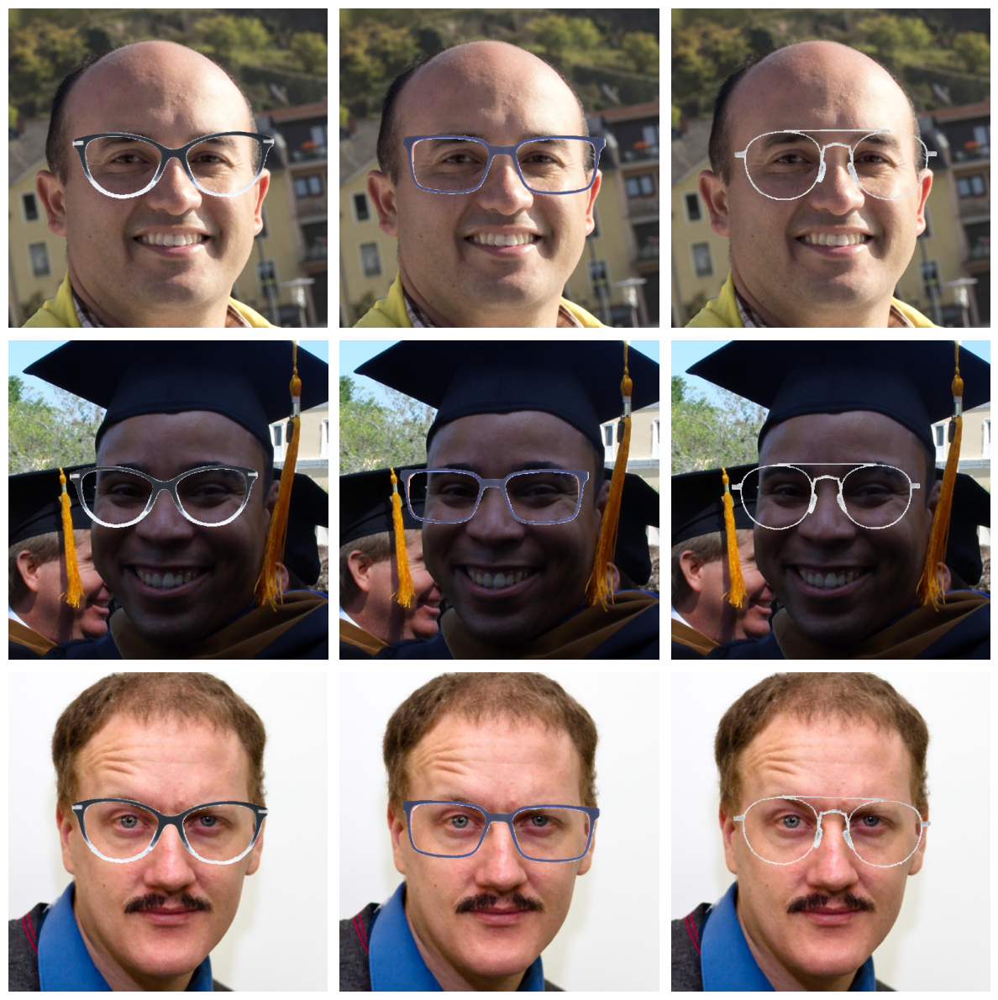

In [6]:
# MORPHOLOGICAL GRADIENT

method_name = "morphological_gradient_harmonization"

def morphological_gradient_harmonization(src, dst, mask):
    """Morphological gradient-based harmonization"""
    
    # Convert to grayscale for morphological operations
    src_gray = cv2.cvtColor(src, cv2.COLOR_RGB2GRAY)
    dst_gray = cv2.cvtColor(dst, cv2.COLOR_RGB2GRAY)
    
    # Create morphological kernels
    kernel_small = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3, 3))
    kernel_large = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (7, 7))
    
    # Compute morphological gradients
    src_grad = cv2.morphologyEx(src_gray, cv2.MORPH_GRADIENT, kernel_small)
    dst_grad = cv2.morphologyEx(dst_gray, cv2.MORPH_GRADIENT, kernel_small)
    
    # Compute texture features using morphological operations
    src_tophat = cv2.morphologyEx(src_gray, cv2.MORPH_TOPHAT, kernel_large)
    dst_tophat = cv2.morphologyEx(dst_gray, cv2.MORPH_TOPHAT, kernel_large)
    
    # Get foreground and background regions
    fg_mask = mask > 0.5
    bg_mask = (1 - mask) > 0.5
    
    # Compute statistics for gradient matching
    if np.any(fg_mask) and np.any(bg_mask):
        
        # gradient stats
        fg_grad_mean = np.mean(src_grad[fg_mask])
        fg_grad_std = np.std(src_grad[fg_mask])
        bg_grad_mean = np.mean(dst_grad[bg_mask])
        bg_grad_std = np.std(dst_grad[bg_mask])
        
        # tophat stats
        fg_tophat_mean = np.mean(src_tophat[fg_mask])
        fg_tophat_std = np.std(src_tophat[fg_mask])
        bg_tophat_mean = np.mean(dst_tophat[bg_mask])
        bg_tophat_std = np.std(dst_tophat[bg_mask])
        
        # Match gradient statistics
        if fg_grad_std > 0:
            grad_scale = bg_grad_std / fg_grad_std
            grad_shift = bg_grad_mean - fg_grad_mean * grad_scale
        else:
            grad_scale = 1.0
            grad_shift = 0.0
        
        # Top-hat scale and shift
        if fg_tophat_std > 0:
            tophat_scale = bg_tophat_std / fg_tophat_std
            tophat_shift = bg_tophat_mean - fg_tophat_mean * tophat_scale
        else:
            tophat_scale = 1.0
            tophat_shift = 0.0
        
        # Apply gradient matching to each color channel
        result = dst.copy()
        
        for channel in range(3):
            src_channel = src[:, :, channel].astype(np.float32)
            dst_channel = dst[:, :, channel].astype(np.float32)
            
            # Apply gradient-based adjustment
            adjusted_channel = dst_channel.copy()
            
            # Use morphological gradient to guide the adjustment
            grad_adj = (src_grad.astype(np.float32) * grad_scale + grad_shift - src_grad.astype(np.float32)) * 0.1
            # Top-hat adjustment
            tophat_adj = (src_tophat.astype(np.float32) * tophat_scale + tophat_shift - src_tophat.astype(np.float32)) * 0.1
            
            # Combine adjustments
            combined_adj = grad_adj + tophat_adj
            
            # Apply adjustment only to foreground region
            adjusted_channel[fg_mask] = src_channel[fg_mask] + combined_adj[fg_mask]
            
            # Ensure values are in valid range
            adjusted_channel = np.clip(adjusted_channel, 0, 255)
            
            result[:, :, channel] = adjusted_channel
        
        # Apply morphological closing to smooth the result
        for channel in range(3):
            result[:, :, channel] = cv2.morphologyEx(
                result[:, :, channel].astype(np.uint8), 
                cv2.MORPH_CLOSE, 
                kernel_small
            )
    
    else:
        result = dst.copy()
    
    return result.astype(np.uint8)

output_dir = f"results/traditional_blend/{method_name}"
os.makedirs(output_dir, exist_ok=True)
os.makedirs("temp_eval", exist_ok=True)

num_faces = len(bg_imgs)
num_glasses = len(glasses_with_masks)

fig, axes = plt.subplots(nrows=num_faces, ncols=num_glasses, figsize=(4 * num_glasses, 4 * num_faces))

# If it's a 1D array (e.g. 1 face, 3 glasses), wrap it to avoid indexing errors
if num_faces == 1 or num_glasses == 1:
    axes = np.array(axes).reshape(num_faces, num_glasses)

for f_idx, bg_img in enumerate(bg_imgs):
    for g_idx, (glasses, mask) in enumerate(glasses_with_masks):
        
        # 0. Fit glasses to face
        aligned_glasses, aligned_mask = fit_glasses_to_face(bg_img, glasses, mask)
        
        # A. Run Diffusion Harmonization
        result = morphological_gradient_harmonization(np.array(aligned_glasses), np.array(bg_img), np.array(aligned_mask) / 255.0)
        
        # B. Save the result
        res_path = os.path.join(output_dir, f"FFHQ_{f_idx}x{g_idx}.png")
        result = Image.fromarray((result).astype(np.uint8))
        result.save(res_path)
        
        # C. Create & Save Naive Copy-Paste (needed for LPIPS baseline)
        naive_result = Image.composite(aligned_glasses, bg_img, aligned_mask)
        naive_path = f"temp_eval/naive_{f_idx}x{g_idx}.png"
        naive_result.save(naive_path)
        
        # D. Save mask temporarily (needed for SAM 2 eval)
        mask_path = f"temp_eval/mask_{g_idx}.png"
        mask.save(mask_path)
        
        # E. Calculate Qualitative Scores
        lpips_score = calculate_lpips(naive_path, res_path)
        iou, mse, dice, sam_mask = calculate_sam_clip_metrics(res_path, mask_path)
        
        cv2.imwrite(os.path.join(output_dir, f"FFHQ_{f_idx}x{g_idx})sam_mask.png"), sam_mask)
        
        print(f"Face {f_idx} x Glasses {g_idx} | LPIPS (V): {lpips_score:.4f} | SAM IoU (^): {iou:.4f} | SAM Dice (V): {dice:.4f}")
        
        # F. Plot on the Grid
        ax = axes[f_idx, g_idx]
        ax.imshow(result)
        ax.axis("off")
        


plt.tight_layout()
grid_path = os.path.join(output_dir, "grid_summary.png")
plt.savefig(grid_path, dpi=600, bbox_inches='tight')
print(f"Saved individual results and grid to {output_dir}")
plt.show()

/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/google/protobuf/symbol_database.py:55: UserWarning: SymbolDatabase.GetPrototype() is deprecated. Please use message_factory.GetMessageClass() instead. SymbolDatabase.GetPrototype() will be removed soon.
  warnings.warn('SymbolDatabase.GetPrototype() is deprecated. Please '


Face 0 x Glasses 0 | LPIPS (V): 0.0270 | SAM IoU (^): 0.0000 | SAM Dice (V): 1.0000
Face 0 x Glasses 1 | LPIPS (V): 0.0231 | SAM IoU (^): 0.1065 | SAM Dice (V): 0.8075
Face 0 x Glasses 2 | LPIPS (V): 0.0314 | SAM IoU (^): 0.0513 | SAM Dice (V): 0.9024
Face 1 x Glasses 0 | LPIPS (V): 0.0209 | SAM IoU (^): 0.0848 | SAM Dice (V): 0.8437
Face 1 x Glasses 1 | LPIPS (V): 0.0193 | SAM IoU (^): 0.0721 | SAM Dice (V): 0.8654
Face 1 x Glasses 2 | LPIPS (V): 0.0265 | SAM IoU (^): 0.0126 | SAM Dice (V): 0.9751
Face 2 x Glasses 0 | LPIPS (V): 0.0208 | SAM IoU (^): 0.0742 | SAM Dice (V): 0.8618
Face 2 x Glasses 1 | LPIPS (V): 0.0245 | SAM IoU (^): 0.0587 | SAM Dice (V): 0.8891
Face 2 x Glasses 2 | LPIPS (V): 0.0233 | SAM IoU (^): 0.0467 | SAM Dice (V): 0.9108
Saved individual results and grid to results/traditional_blend/histogram_matching


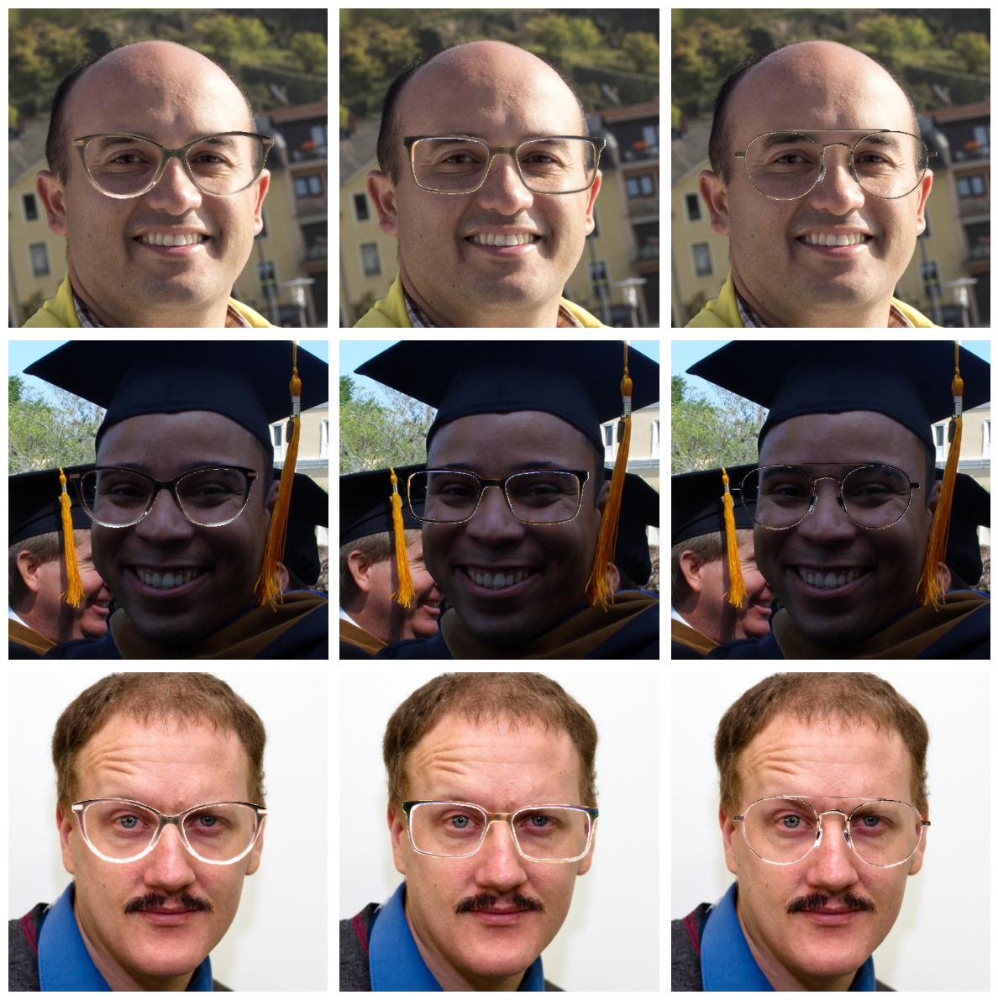

Face 0 x Glasses 0 | LPIPS (V): 0.4319 | SAM IoU (^): 0.0058 | SAM Dice (V): 0.9884
Face 0 x Glasses 1 | LPIPS (V): 0.3890 | SAM IoU (^): 0.0605 | SAM Dice (V): 0.8859
Face 0 x Glasses 2 | LPIPS (V): 0.3084 | SAM IoU (^): 0.0000 | SAM Dice (V): 1.0000
Face 1 x Glasses 0 | LPIPS (V): 0.3596 | SAM IoU (^): 0.1027 | SAM Dice (V): 0.8137
Face 1 x Glasses 1 | LPIPS (V): 0.3148 | SAM IoU (^): 0.0735 | SAM Dice (V): 0.8630
Face 1 x Glasses 2 | LPIPS (V): 0.4602 | SAM IoU (^): 0.0343 | SAM Dice (V): 0.9338
Face 2 x Glasses 0 | LPIPS (V): 0.4564 | SAM IoU (^): 0.0765 | SAM Dice (V): 0.8578
Face 2 x Glasses 1 | LPIPS (V): 0.5665 | SAM IoU (^): 0.0595 | SAM Dice (V): 0.8876
Face 2 x Glasses 2 | LPIPS (V): 0.3587 | SAM IoU (^): 0.0017 | SAM Dice (V): 0.9967
Saved individual results and grid to results/traditional_blend/histogram_matching_inverted


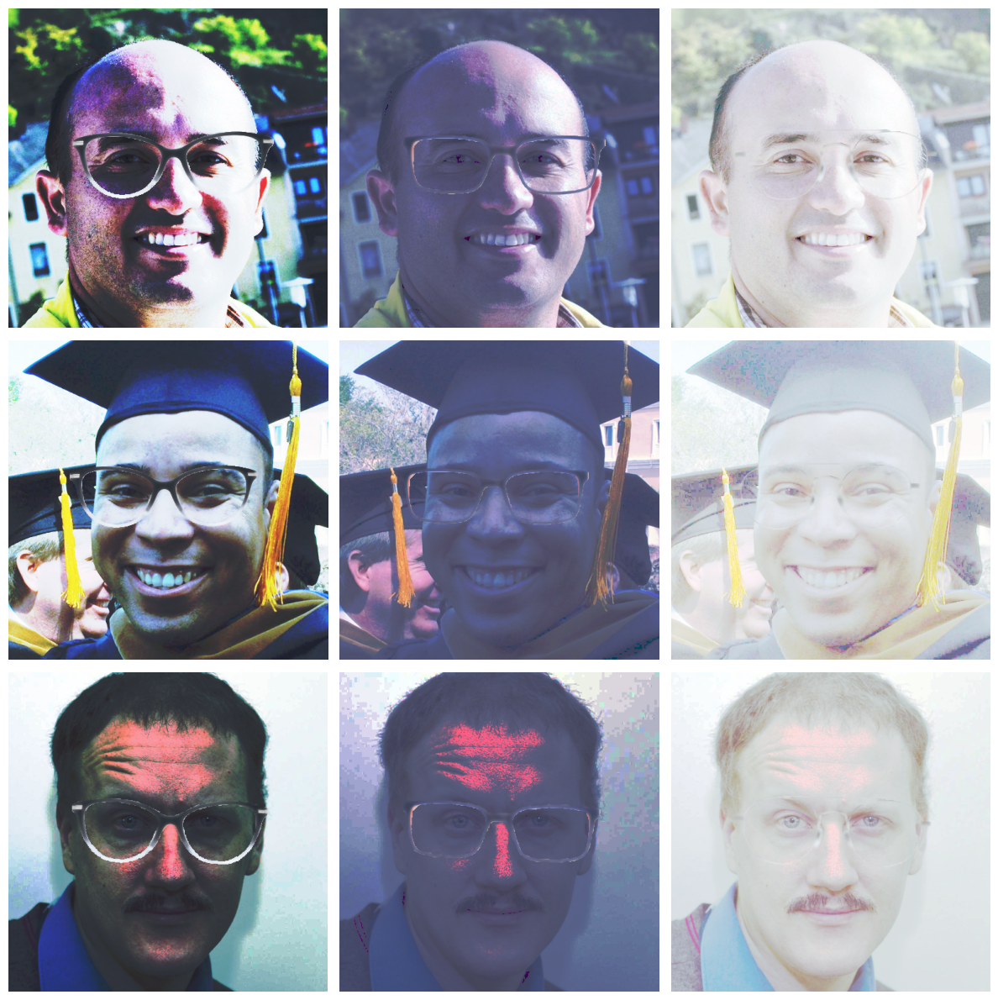

In [3]:
# HISTOGRAM MATCHING

method_name = "histogram_matching"

def histogram_matching_with_coherence(src, dst, mask, inverted=False):
    """Histogram matching with spatial coherence constraints"""
    
    if inverted:
        mask = 1 - mask
        src, dst = dst, src
    
    result = dst.copy()
    
    # Process each color channel separately
    for channel in range(3):
        src_channel = src[:, :, channel]
        dst_channel = dst[:, :, channel]
        
        # Get foreground and background histograms
        fg_mask = mask > 0.5
        bg_mask = (1 - mask) > 0.5
        
        fg_pixels = src_channel[fg_mask]
        bg_pixels = dst_channel[bg_mask]
        
        if len(fg_pixels) > 0 and len(bg_pixels) > 0:
            # Compute histograms
            fg_hist, fg_bins = np.histogram(fg_pixels, bins=256, range=(0, 255))
            bg_hist, bg_bins = np.histogram(bg_pixels, bins=256, range=(0, 255))
            
            # Compute cumulative distributions
            fg_cdf = fg_hist.cumsum()
            bg_cdf = bg_hist.cumsum()
            
            # Normalize
            fg_cdf = fg_cdf / fg_cdf[-1]
            bg_cdf = bg_cdf / bg_cdf[-1]
            
            # Create lookup table for histogram matching
            lut = np.zeros(256, dtype=np.uint8)
            for i in range(256):
                # Find closest value in background CDF
                diff = np.abs(bg_cdf - fg_cdf[i])
                lut[i] = np.argmin(diff)
            
            # Apply histogram matching
            matched_channel = result[:, :, channel].copy()
            matched_channel[fg_mask] = lut[src_channel[fg_mask]]
            
            # Apply spatial coherence using edge-preserving smoothing
            # Create a weight map based on distance from mask boundary
            kernel = np.ones((3, 3), np.uint8)
            dilated_mask = cv2.dilate(mask, kernel, iterations=5)
            
            # Smooth the transition region
            transition_mask = dilated_mask - mask
            transition_mask = transition_mask > 0.5
            
            if np.any(transition_mask):
                # Apply bilateral filter to preserve edges while smoothing
                smoothed = cv2.bilateralFilter(matched_channel, 9, 75, 75)
                matched_channel[transition_mask] = smoothed[transition_mask]
            
            result[:, :, channel] = matched_channel
            
    return result

output_dir = f"results/traditional_blend/{method_name}"
os.makedirs(output_dir, exist_ok=True)
os.makedirs("temp_eval", exist_ok=True)

num_faces = len(bg_imgs)
num_glasses = len(glasses_with_masks)

fig, axes = plt.subplots(nrows=num_faces, ncols=num_glasses, figsize=(4 * num_glasses, 4 * num_faces))

# If it's a 1D array (e.g. 1 face, 3 glasses), wrap it to avoid indexing errors
if num_faces == 1 or num_glasses == 1:
    axes = np.array(axes).reshape(num_faces, num_glasses)

for f_idx, bg_img in enumerate(bg_imgs):
    for g_idx, (glasses, mask) in enumerate(glasses_with_masks):
        
        # 0. Fit glasses to face
        aligned_glasses, aligned_mask = fit_glasses_to_face(bg_img, glasses, mask)
        
        # A. Run Diffusion Harmonization
        result = histogram_matching_with_coherence(np.array(aligned_glasses), np.array(bg_img), np.array(aligned_mask) / 255.0)
        
        # B. Save the result
        res_path = os.path.join(output_dir, f"FFHQ_{f_idx}x{g_idx}.png")
        result = Image.fromarray((result).astype(np.uint8))
        result.save(res_path)
        
        # C. Create & Save Naive Copy-Paste (needed for LPIPS baseline)
        naive_result = Image.composite(aligned_glasses, bg_img, aligned_mask)
        naive_path = f"temp_eval/naive_{f_idx}x{g_idx}.png"
        naive_result.save(naive_path)
        
        # D. Save mask temporarily (needed for SAM 2 eval)
        mask_path = f"temp_eval/mask_{g_idx}.png"
        mask.save(mask_path)
        
        # E. Calculate Qualitative Scores
        lpips_score = calculate_lpips(naive_path, res_path)
        iou, mse, dice, sam_mask = calculate_sam_clip_metrics(res_path, mask_path)
        
        cv2.imwrite(os.path.join(output_dir, f"FFHQ_{f_idx}x{g_idx})sam_mask.png"), sam_mask)
        
        print(f"Face {f_idx} x Glasses {g_idx} | LPIPS (V): {lpips_score:.4f} | SAM IoU (^): {iou:.4f} | SAM Dice (V): {dice:.4f}")
        
        # F. Plot on the Grid
        ax = axes[f_idx, g_idx]
        ax.imshow(result)
        ax.axis("off")
        
plt.tight_layout()
grid_path = os.path.join(output_dir, "grid_summary.png")
plt.savefig(grid_path, dpi=600, bbox_inches='tight')
print(f"Saved individual results and grid to {output_dir}")
plt.show()

method_name = "histogram_matching_inverted"

output_dir = f"results/traditional_blend/{method_name}"
os.makedirs(output_dir, exist_ok=True)
os.makedirs("temp_eval", exist_ok=True)

num_faces = len(bg_imgs)
num_glasses = len(glasses_with_masks)

fig, axes = plt.subplots(nrows=num_faces, ncols=num_glasses, figsize=(4 * num_glasses, 4 * num_faces))

# If it's a 1D array (e.g. 1 face, 3 glasses), wrap it to avoid indexing errors
if num_faces == 1 or num_glasses == 1:
    axes = np.array(axes).reshape(num_faces, num_glasses)

for f_idx, bg_img in enumerate(bg_imgs):
    for g_idx, (glasses, mask) in enumerate(glasses_with_masks):
        
        # 0. Fit glasses to face
        aligned_glasses, aligned_mask = fit_glasses_to_face(bg_img, glasses, mask)
        
        # A. Run Diffusion Harmonization
        result = histogram_matching_with_coherence(np.array(aligned_glasses), np.array(bg_img), np.array(aligned_mask) / 255.0, inverted=True)
        
        # B. Save the result
        res_path = os.path.join(output_dir, f"FFHQ_{f_idx}x{g_idx}.png")
        result = Image.fromarray((result).astype(np.uint8))
        result.save(res_path)
        
        # C. Create & Save Naive Copy-Paste (needed for LPIPS baseline)
        naive_result = Image.composite(aligned_glasses, bg_img, aligned_mask)
        naive_path = f"temp_eval/naive_{f_idx}x{g_idx}.png"
        naive_result.save(naive_path)
        
        # D. Save mask temporarily (needed for SAM 2 eval)
        mask_path = f"temp_eval/mask_{g_idx}.png"
        mask.save(mask_path)
        
        # E. Calculate Qualitative Scores
        lpips_score = calculate_lpips(naive_path, res_path)
        iou, mse, dice, sam_mask = calculate_sam_clip_metrics(res_path, mask_path)
        
        cv2.imwrite(os.path.join(output_dir, f"FFHQ_{f_idx}x{g_idx})sam_mask.png"), sam_mask)
        
        print(f"Face {f_idx} x Glasses {g_idx} | LPIPS (V): {lpips_score:.4f} | SAM IoU (^): {iou:.4f} | SAM Dice (V): {dice:.4f}")
        
        # F. Plot on the Grid
        ax = axes[f_idx, g_idx]
        ax.imshow(result)
        ax.axis("off")
        


plt.tight_layout()
grid_path = os.path.join(output_dir, "grid_summary.png")
plt.savefig(grid_path, dpi=600, bbox_inches='tight')
print(f"Saved individual results and grid to {output_dir}")
plt.show()


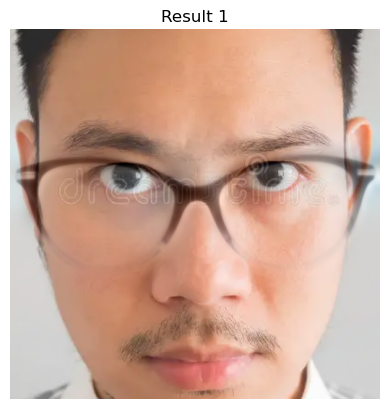

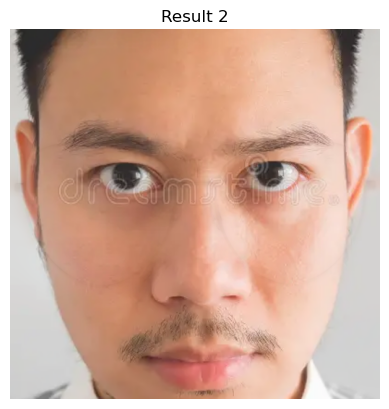

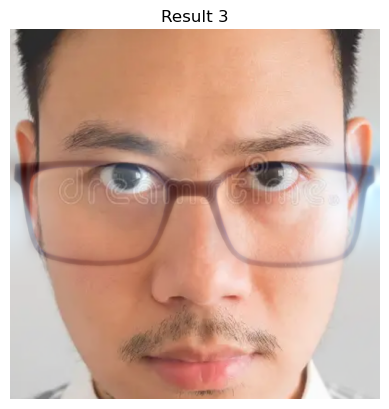

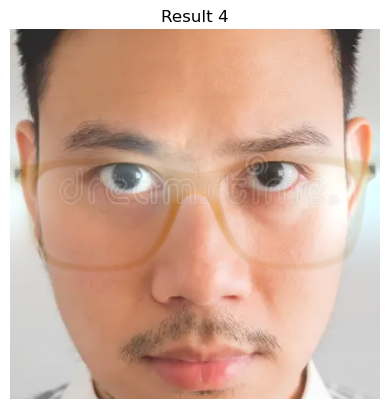

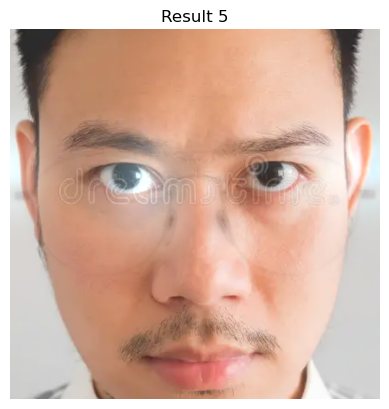

In [26]:
# MULTISCALE HARMONIZATION

# Main idea is to

# 1. Generate Gaussian Pyramid for mask
#         (allows blending on diverse levels of detail)

# 2. Generate Laplassian Pyramids for images
#         (captures the difference between adjacent levels of the Gaussian pyramid)
#         (separates the fine details <high frequencies> from the coarse ones <low frequencies>)

# 3. Blend Pyramids
#         (At each level of the pyramids, the images are blended based on the mask's corresponding level.
#           The mask defines how much of the source and destination images should be mixed at each level.
#           This way of blending helps to ensure the smooth and natural transition between the images
#          )

# 4. Reconstruct final image from blended pyramid
#         (By starting from the smallest level of the pyramid and successively upscaling
#           and adding the details from each level
#         )

def multiscale_harmonization(src, mask, dst, levels=6):
    """Multi-scale pyramid harmonization"""
    
    # Build pyramids
    src_pyramid = build_laplacian_pyramid(src, levels)
    dst_pyramid = build_laplacian_pyramid(dst, levels)
    
    # Create mask pyramid
    mask_pyramid = [mask]
    for i in range(levels):
        mask_pyramid.append(cv2.pyrDown(mask_pyramid[i]))
    
    # Blend pyramids
    blended_pyramid = []
    for i in range(len(src_pyramid)):
        # Resize mask to match current level
        if i < len(mask_pyramid):
            current_mask = mask_pyramid[i]
        else:
            current_mask = mask_pyramid[-1]
        
        # Ensure mask has same dimensions as pyramid level
        if current_mask.shape[:2] != src_pyramid[i].shape[:2]:
            current_mask = cv2.resize(current_mask, 
                                    (src_pyramid[i].shape[1], src_pyramid[i].shape[0]))
        
        # Extend mask to 3 channels if needed
        if len(current_mask.shape) == 2:
            current_mask = np.stack([current_mask] * 3, axis=2)
        
        # Blend current level
        blended = src_pyramid[i] * current_mask + dst_pyramid[i] * (1 - current_mask)
        blended_pyramid.append(blended)
    
    # Reconstruct
    result = reconstruct_from_laplacian_pyramid(blended_pyramid)
    
    return result

def build_laplacian_pyramid(image, levels=4):
    """Build Laplacian pyramid"""
    gaussian_pyramid = [image.astype(np.float32)]
    
    for i in range(levels):
        gaussian_pyramid.append(cv2.pyrDown(gaussian_pyramid[i]))
    
    laplacian_pyramid = [gaussian_pyramid[levels]]
    
    for i in range(levels, 0, -1):
        size = (gaussian_pyramid[i-1].shape[1], gaussian_pyramid[i-1].shape[0])
        gaussian_expanded = cv2.pyrUp(gaussian_pyramid[i], dstsize=size)
        laplacian = cv2.subtract(gaussian_pyramid[i-1], gaussian_expanded)
        laplacian_pyramid.append(laplacian)
    
    return laplacian_pyramid

def reconstruct_from_laplacian_pyramid(laplacian_pyramid):
    """Reconstruct image from Laplacian pyramid"""
    reconstructed = laplacian_pyramid[0]
    
    for i in range(1, len(laplacian_pyramid)):
        size = (laplacian_pyramid[i].shape[1], laplacian_pyramid[i].shape[0])
        reconstructed = cv2.pyrUp(reconstructed, dstsize=size)
        reconstructed = cv2.add(reconstructed, laplacian_pyramid[i])
    
    return np.clip(reconstructed, 0, 255).astype(np.uint8)

for i, (glasses, mask) in enumerate(glasses_with_masks):
    result = multiscale_harmonization(glasses, mask, bg_img, levels=6)
    plt.figure()
    plt.imshow(result)
    plt.axis("off")
    plt.title(f"Result {i+1}")
plt.show()


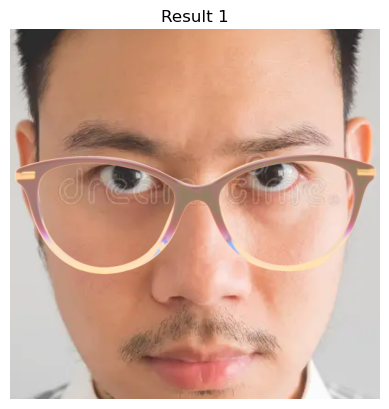

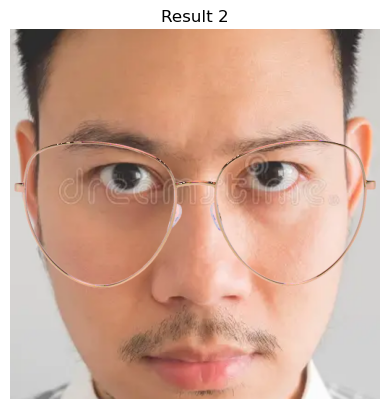

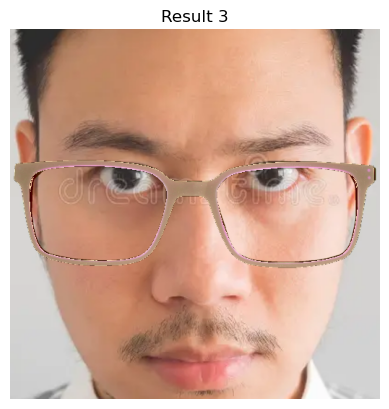

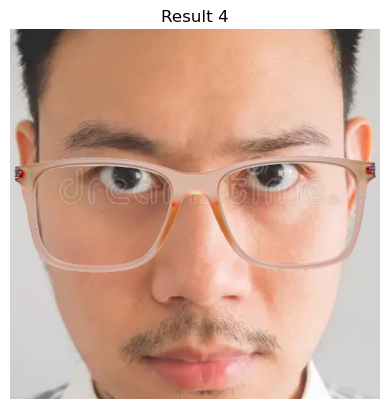

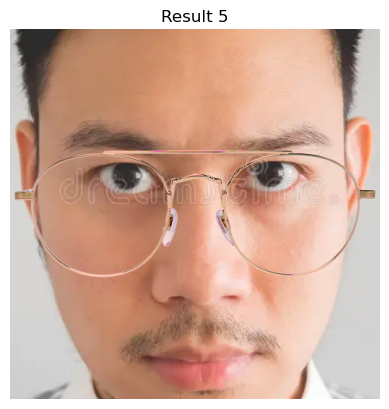

In [35]:
# COLOUR TRANSFER

def color_transfer_harmonization(src, mask, dst):
    """Color transfer harmonization using LAB color space"""
    
    # Convert to LAB color space
    src_lab = cv2.cvtColor(src, cv2.COLOR_RGB2LAB).astype(np.float32)
    dst_lab = cv2.cvtColor(dst, cv2.COLOR_RGB2LAB).astype(np.float32)
    
    # Get background region statistics
    bg_mask = (1 - mask) > 0.5
    bg_mask_3d = np.stack([bg_mask] * 3, axis=2)
    
    # Calculate mean and std for background
    bg_mean = np.mean(dst_lab[bg_mask_3d].reshape(-1, 3), axis=0)
    bg_std = np.std(dst_lab[bg_mask_3d].reshape(-1, 3), axis=0)
    
    # Get foreground region statistics
    fg_mask = mask > 0.5
    fg_mask_3d = np.stack([fg_mask] * 3, axis=2)
    
    # Calculate mean and std for foreground
    fg_mean = np.mean(src_lab[fg_mask_3d].reshape(-1, 3), axis=0)
    fg_std = np.std(src_lab[fg_mask_3d].reshape(-1, 3), axis=0)
    
    # Prevent division by zero
    fg_std = np.where(fg_std == 0, 1e-6, fg_std)
    
    # Color transfer
    src_lab_corrected = src_lab.copy()
    
    # Apply color transfer to foreground region
    for i in range(3):
        src_lab_corrected[:, :, i] = (src_lab[:, :, i] - fg_mean[i]) * (bg_std[i] / fg_std[i]) + bg_mean[i]
    
    # Convert back to RGB
    result_rgb = cv2.cvtColor(src_lab_corrected.astype(np.uint8), cv2.COLOR_LAB2RGB)
    
    # Blend with original background
    mask_3d = np.stack([mask] * 3, axis=2)
    result = dst.copy().astype(np.uint8)
    result = result * (1 - mask_3d) + result_rgb * mask_3d
    
    return result.astype(np.uint8)

for i, (glasses, mask) in enumerate(glasses_with_masks):
    result = color_transfer_harmonization(glasses, mask, bg_img)
    plt.figure()
    plt.imshow(result)
    plt.axis("off")
    plt.title(f"Result {i+1}")
plt.show()

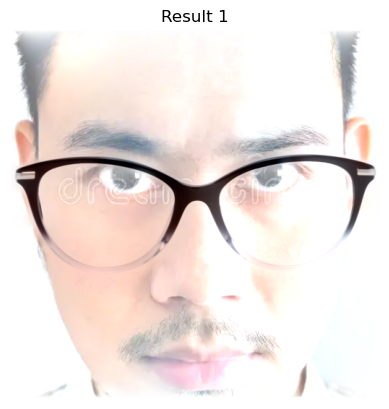

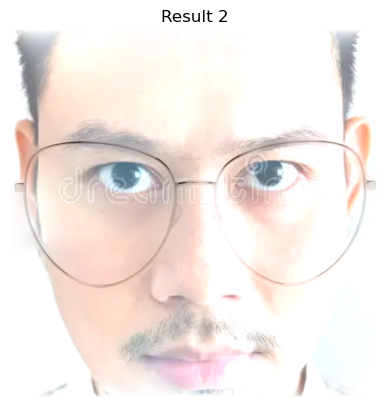

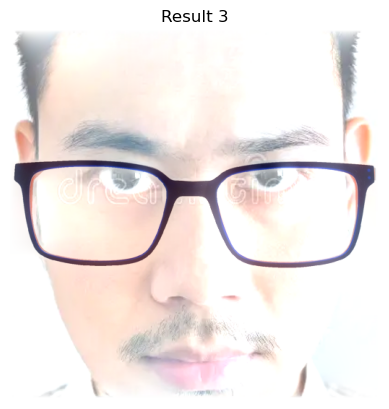

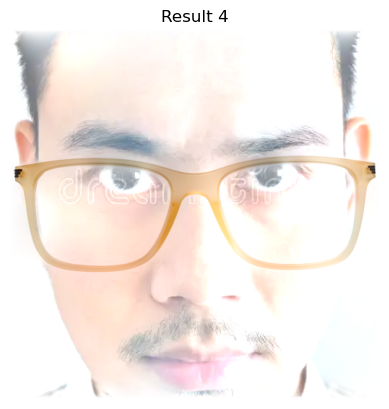

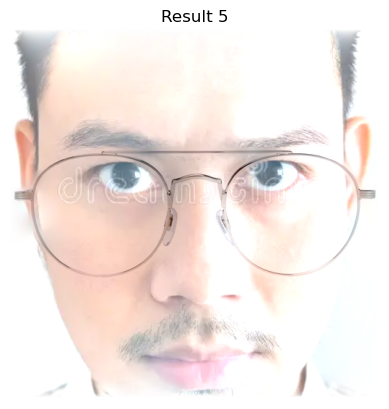

In [33]:
# POISSON SEAMLESS CLONE

def poisson_blending(src, mask, dst):
    """Traditional Poisson blending using OpenCV's seamlessClone"""
    
    src, dst = dst, src
    mask = 1 - mask
    
    mask_binary = (mask > 0.5).astype(np.uint8) * 255

    moments = cv2.moments(mask_binary)
    if moments["m00"] != 0:
        cx = int(moments["m10"] / moments["m00"])
        cy = int(moments["m01"] / moments["m00"])
    else:
        cy, cx = np.unravel_index(np.argmax(mask_binary), mask_binary.shape)
    
    center = (cx, cy)
    result = cv2.seamlessClone(src, dst, mask_binary, center, cv2.NORMAL_CLONE)
    return result

for i, (glasses, mask) in enumerate(glasses_with_masks):
    result = poisson_blending(glasses, mask, bg_img)
    plt.figure()
    plt.imshow(result)
    plt.axis("off")
    plt.title(f"Result {i+1}")
plt.show()

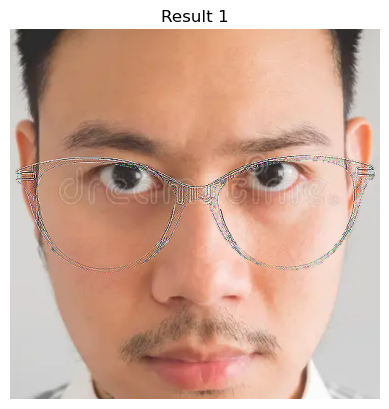

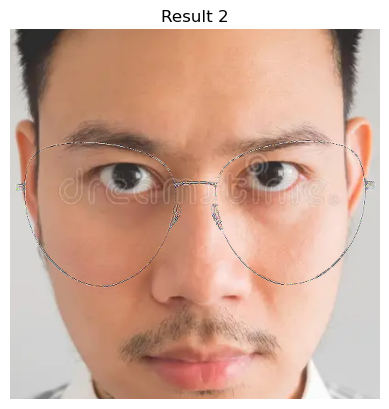

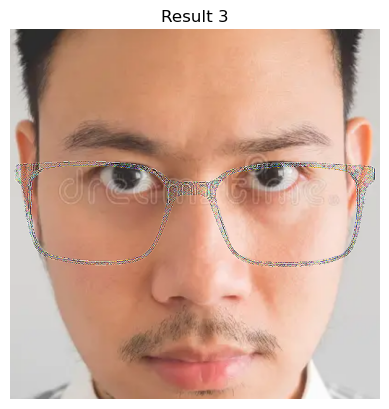

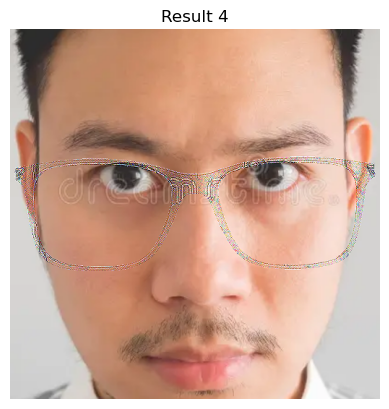

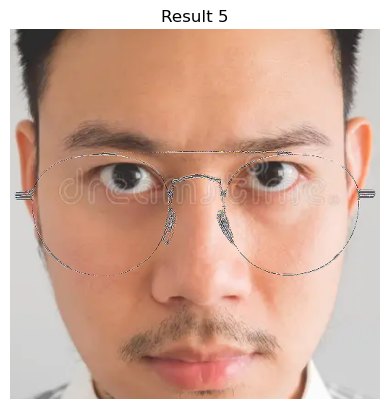

In [10]:
# GRADIENT DOMAIN HARMONIZATION

def gradient_domain_harmonization(src, mask, dst):
    """Gradient domain harmonization using optimization"""
    h, w = src.shape[:2]
    
    # Create binary mask
    binary_mask = (mask > 0.5).astype(np.uint8)
    
    # Create boundary mask
    kernel = np.ones((3, 3), np.uint8)
    boundary_mask = cv2.morphologyEx(binary_mask, cv2.MORPH_GRADIENT, kernel)
    
    result = dst.copy()
    
    # Process each color channel
    for channel in range(3):
        src_channel = src[:, :, channel].astype(np.float32)
        dst_channel = dst[:, :, channel].astype(np.float32)
        
        # Compute gradients
        grad_x = cv2.Sobel(src_channel, cv2.CV_32F, 1, 0, ksize=3)
        grad_y = cv2.Sobel(src_channel, cv2.CV_32F, 0, 1, ksize=3)
        
        # Apply gradient modification in the boundary region
        boundary_region = boundary_mask > 0
        
        # Smooth gradients at boundary
        if np.any(boundary_region):
            grad_x[boundary_region] *= 0.5
            grad_y[boundary_region] *= 0.5
        
        # Simple gradient integration (approximate)
        # Use iterative approach to integrate gradients
        integrated = dst_channel.copy()
        fg_region = binary_mask > 0
        
        # Iteratively adjust foreground region
        for _ in range(11):
            # Compute divergence
            div = cv2.Laplacian(integrated, cv2.CV_32F)
            target_div = cv2.Laplacian(src_channel, cv2.CV_32F)
            
            # Update only foreground region
            integrated[fg_region] += 0.1 * (target_div[fg_region] - div[fg_region])
            
            # Ensure boundary conditions
            integrated[boundary_region] = 0.5 * (integrated[boundary_region] + dst_channel[boundary_region])
        
        result[:, :, channel] = np.clip(integrated, 0, 255)
    
    return result.astype(np.uint8)

for i, (glasses, mask) in enumerate(glasses_with_masks):
    result = gradient_domain_harmonization(glasses, mask, bg_img)
    plt.figure()
    plt.imshow(result)
    plt.axis("off")
    plt.title(f"Result {i+1}")
plt.show()

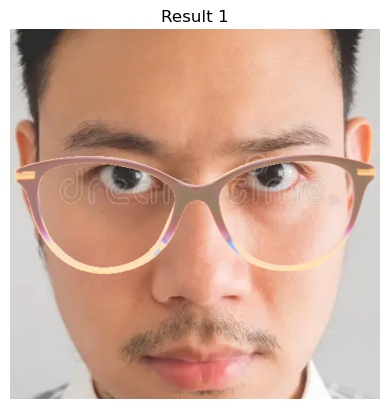

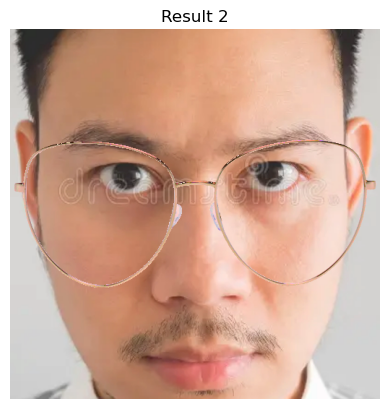

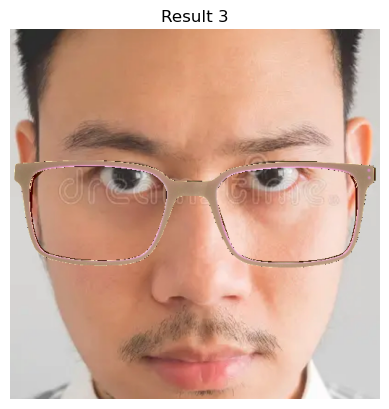

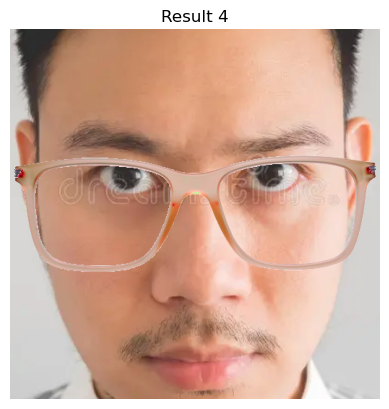

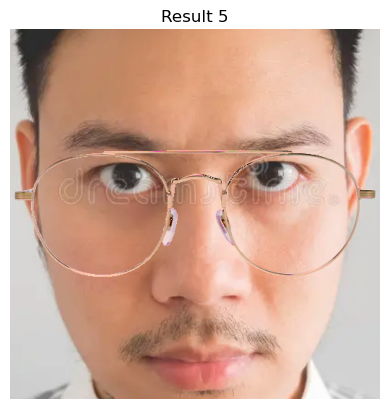

In [30]:
# STYLE TRANSFER

def style_transfer_harmonization(src, mask, dst):
    """Style transfer-based harmonization using neural style transfer concepts"""
    
    # Convert to LAB color space for better color manipulation
    src_lab = cv2.cvtColor(src, cv2.COLOR_RGB2LAB).astype(np.float32)
    dst_lab = cv2.cvtColor(dst, cv2.COLOR_RGB2LAB).astype(np.float32)
    
    # Extract style (color statistics) from background
    bg_mask = (1 - mask) > 0.5
    bg_pixels = dst_lab[bg_mask]
    
    # Calculate style statistics
    bg_mean = np.mean(bg_pixels, axis=0)
    bg_std = np.std(bg_pixels, axis=0)
    
    # Apply style transfer to foreground
    fg_mask = mask > 0.5
    fg_pixels = src_lab[fg_mask]
    
    if len(fg_pixels) > 0:
        fg_mean = np.mean(fg_pixels, axis=0)
        fg_std = np.std(fg_pixels, axis=0)
        
        # Prevent division by zero
        fg_std = np.where(fg_std == 0, 1e-6, fg_std)
        
        # Style transfer: match mean and std
        stylized_fg = (fg_pixels - fg_mean) / fg_std * bg_std + bg_mean
        
        # Apply stylized colors back to image
        result_lab = dst_lab.copy()
        result_lab[fg_mask] = stylized_fg
        
        # Convert back to RGB
        result = cv2.cvtColor(result_lab.astype(np.uint8), cv2.COLOR_LAB2RGB)
        
        # Additional texture matching using gradient information
        src_gray = cv2.cvtColor(src, cv2.COLOR_RGB2GRAY)
        dst_gray = cv2.cvtColor(dst, cv2.COLOR_RGB2GRAY)
        
        # Compute gradients
        src_grad = cv2.Laplacian(src_gray, cv2.CV_32F)
        dst_grad = cv2.Laplacian(dst_gray, cv2.CV_32F)
        
        # Match gradient statistics
        fg_grad = src_grad[fg_mask]
        bg_grad = dst_grad[bg_mask]
        
        if len(bg_grad) > 0:
            grad_scale = np.std(bg_grad) / (np.std(fg_grad) + 1e-6)
            
            # Apply gradient matching
            for c in range(3):
                channel = result[:, :, c].astype(np.float32)
                channel[fg_mask] = channel[fg_mask] + grad_scale * src_grad[fg_mask] * 0.1
                result[:, :, c] = np.clip(channel, 0, 255)
        
        return result.astype(np.uint8)
    
    return dst

for i, (glasses, mask) in enumerate(glasses_with_masks):
    result = style_transfer_harmonization(glasses, mask, bg_img)
    plt.figure()
    plt.imshow(result)
    plt.axis("off")
    plt.title(f"Result {i+1}")
plt.show()